중간고사 과제 1
- 주어진 영상에 대하여 팽창, 침식, 열림, 닫기 연산을 위한 함수를 구현

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def plot_img(images, titles):
  fig, axs = plt.subplots(nrows = 1, ncols = len(images), figsize = (15, 15))
  for i, p in enumerate(images):
    axs[i].imshow(p, 'gray')
    axs[i].set_title(titles[i])
    #axs[i].axis('off')
  plt.show()

주어진 영상을 읽고 가시화

In [ ]:
!wget https://www.shrednations.com/wp-content/uploads/corporate-espionage.jpg

--2021-10-27 09:34:01--  https://www.shrednations.com/wp-content/uploads/corporate-espionage.jpg
Resolving www.shrednations.com (www.shrednations.com)... 173.255.203.102
Connecting to www.shrednations.com (www.shrednations.com)|173.255.203.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 476829 (466K) [image/jpeg]
Saving to: ‘corporate-espionage.jpg’

corporate-espionage 100%[===================>] 465.65K  --.-KB/s    in 0.1s    

2021-10-27 09:34:02 (3.23 MB/s) - ‘corporate-espionage.jpg’ saved [476829/476829]



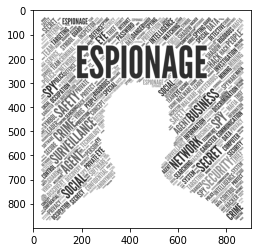

900 900


In [ ]:
img = cv2.imread('corporate-espionage.jpg', 0)
plt.imshow(img, 'gray')
plt.show()
height, width  = img.shape
print(width, height)

영상 이진화

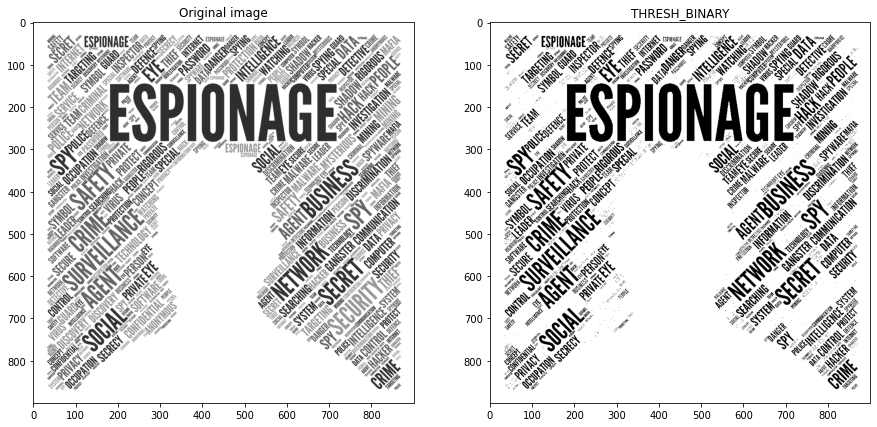

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


In [ ]:
ret, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

# Plot the images
images = [img, binary_img]
titles = ['Original image', 'THRESH_BINARY']
plot_img(images, titles)

print(binary_img)

문제 1: 4연결성 기준 3X3, 5X5 팽창, 침식, 열기, 닫기 함수를 구현하고 이에 대한 결과를 가시화하기
- 필터의 모양은 아래 그림을 참고하여사용할 것

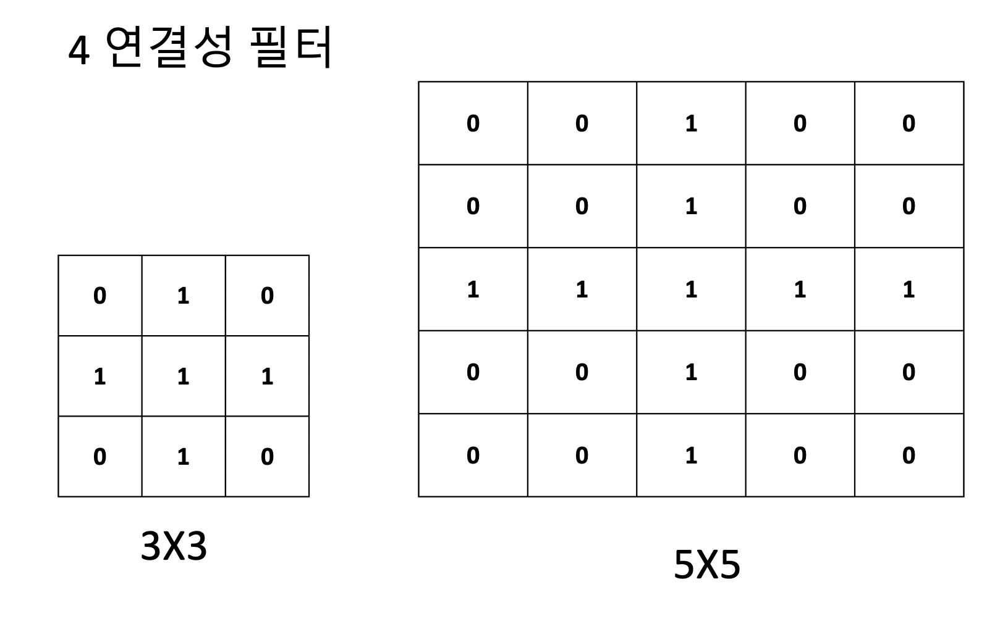

# **중요: 주어진 이진화된 영상의 검은색 부분(픽셀 값이 0인 부분) 에대하여 팽창, 침식, 열기, 닫기 과정을 수행하시오**

------------
# 1) 직접 구현

In [ ]:
# https://gist.github.com/rahit/e8ac25d30b3cfc1f1e1a3da3be90a053
# https://github.com/gencersumbul/sumbul_binary/blob/master/binary_operations.py
# https://medium.com/@ami25480/morphological-image-processing-operations-dilation-erosion-opening-and-closing-with-and-without-c95475468fca(😁)

# 3x3 팽창(dilation) 함수 작성
def dilation_3x3(img):
    # 함수 작성
    # Acquire size of the image
    p,q = img.shape
    # Show the image
    # plt.imshow(img, cmap="gray")
    # Define the structuring element 
    kernel = np.array([[0,1,0], [1,1,1], [0,1,0]]) # filter, structured element
    # print(kernel.shape) # (3, 3)

    constant = kernel.shape[0] // 2 # to avoid crossing the bounary of the image


    # padding
    padding_img = np.zeros((p + constant*2, q + constant*2), dtype=np.uint8) 
    padding_img[constant:p+constant, constant:q+constant] = img.copy()
    # Define new image to store the pixels of dilated image
    imgDilate = np.zeros((p,q), dtype=np.uint8)
    
    # Dilation operation without using inbuilt CV2 function
    for i in range(p):
      for j in range(q):
        temp = padding_img[i:i+kernel.shape[0], j:j+kernel.shape[1]]
        # image (i-constant <=   < i + constant + 1)
        # print(temp) # 
        # print(temp.shape) # 0x0
        product = temp*kernel # element-wise multiplication
        imgDilate[i,j] = np.max(product)
    return imgDilate

# 3x3 침식(erosion) 함수 작성
def erosion_3x3(img):
    # 함수 작성
    # Acquire size of the image
    p,q = img.shape 
    # Show the image
    # plt.imshow(img, cmap="gray")
    
    # Define the structuring element
    kernel = np.array([[0,1,0], [1,1,1], [0,1,0]])
    # kernel_invert = np.where(kernel == 1, 0, 1)
    kernel_invert = np.logical_not(kernel).astype('uint8')
    # kernel_invert = np.array([[1,0,1], [0,0,0], [1,0,1]])
    # print(kernel_invert)
    constant = kernel.shape[0] // 2 # to avoid crossing the bounary of the image

    # padding
    padding_img = np.zeros((p + constant*2, q + constant*2), dtype=np.uint8) 
    padding_img[constant:p+constant, constant:q+constant] = img.copy()

    # Define new image to store the pixels of erosed image
    imgErode = np.zeros((p,q), dtype=np.uint8)

    # Erosion without using inbuilt cv2 function for morphology
    for i in range(p):
      for j in range(q):
        temp = padding_img[i:i+kernel.shape[0], j:j+kernel.shape[1]]
        product = temp*kernel + kernel_invert*255 # if kernel value is 0, the product value is 0
        # print('ppp', product)
        imgErode[i,j] = np.min(product)
    return imgErode

# 3x3 열기(open) 함수 작성
# AoB= (A e B) d B
def open_3x3(img):
    # 함수 작성
    AeB = erosion_3x3(img)
    AeBdB = dilation_3x3(AeB)
    return AeBdB

# 3x3 닫기(close) 함수 작성
# AcB= (A d B) e B
def close_3x3(img):
    # 함수 작성
    AdB = dilation_3x3(img)
    AdBeB = erosion_3x3(AdB)
    return AdBeB

In [ ]:
# References
# https://gist.github.com/rahit/e8ac25d30b3cfc1f1e1a3da3be90a053
# https://github.com/gencersumbul/sumbul_binary/blob/master/binary_operations.py
# https://medium.com/@ami25480/morphological-image-processing-operations-dilation-erosion-opening-and-closing-with-and-without-c95475468fca(😁)

# 5x5 팽창(dilatioin) 함수 작성
def dilation_5x5(img):
    # 함수 작성
    # Acquire size of the image
    p,q = img.shape
    # Show the image
    # plt.imshow(img, cmap="gray")

    # Define the structuring element 
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    # print(kernel.shape)
    constant = kernel.shape[0] // 2 # to avoid crossing the bounary of the image
    # padding
    padding_img = np.zeros((p + constant*2, q + constant*2), dtype=np.uint8) 
    padding_img[constant:p+constant, constant:q+constant] = img.copy()

    # Define new image to store the pixels of dilated image
    imgDilate = np.zeros((p,q), dtype=np.uint8)
    
    # Dilation operation without using inbuilt CV2 function
    for i in range(p):
      for j in range(q):
        temp = padding_img[i:i+kernel.shape[0], j:j+kernel.shape[1]]
        product = temp*kernel
        imgDilate[i,j] = np.max(product)
    return imgDilate

# 5x5 침식(erosion) 함수 작성
def erosion_5x5(img):
    # 함수 작성
    # Acquire size of the image
    p,q = img.shape 
    # Show the image
    # plt.imshow(img, cmap="gray")
    # Define the structuring element
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    # kernel_invert = np.where(kernel == 1, 0, 1)
    kernel_invert = np.logical_not(kernel).astype('uint8')
    # print(kernel_invert)
    constant = kernel.shape[0] // 2 # to avoid crossing the bounary of the image
    # padding
    padding_img = np.zeros((p + constant*2, q + constant*2), dtype=np.uint8) 
    padding_img[constant:p+constant, constant:q+constant] = img.copy()
    # Define new image to store the pixels of erosed image
    imgErode = np.zeros((p,q), dtype=np.uint8)
    # Erosion without using inbuilt cv2 function for morphology
    for i in range(p):
      for j in range(q):
        temp = padding_img[i:i+kernel.shape[0], j:j+kernel.shape[1]]
        product = temp*kernel + kernel_invert*255 # if kernel value is 0, the product value is 0
        # print('ppp', product)
        imgErode[i,j] = np.min(product)
    return imgErode

# 5x5 열기(open) 함수 작성
# AoB= (A e B) d B
def open_5x5(img):
    # 함수 작성
    AeB = erosion_5x5(img)
    AeBdB = dilation_5x5(AeB)
    return AeBdB

# 5x5 닫기(close) 함수 작성
# AcB= (A d B) e B
def close_5x5(img):
    # 함수 작성
    AdB = dilation_5x5(img)
    AdBeB = erosion_5x5(AdB)
    return AdBeB

함수를 이용하여 가시화

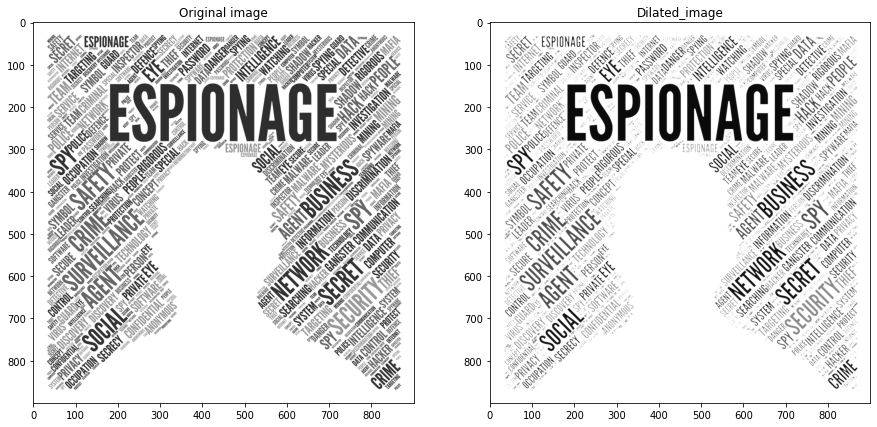

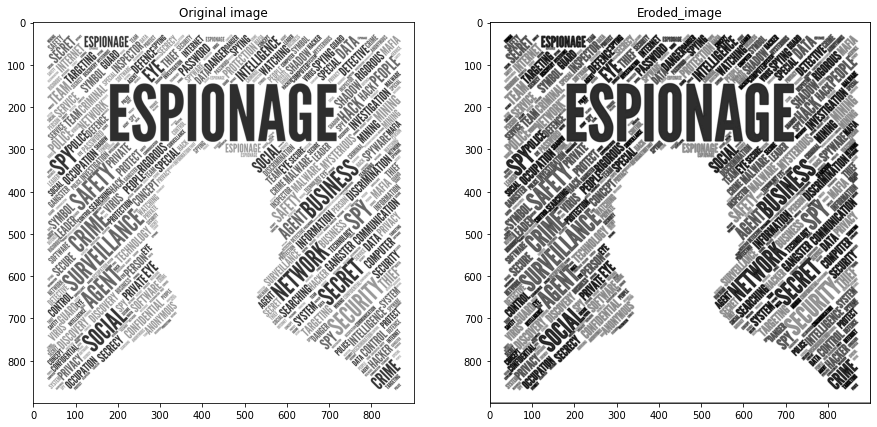

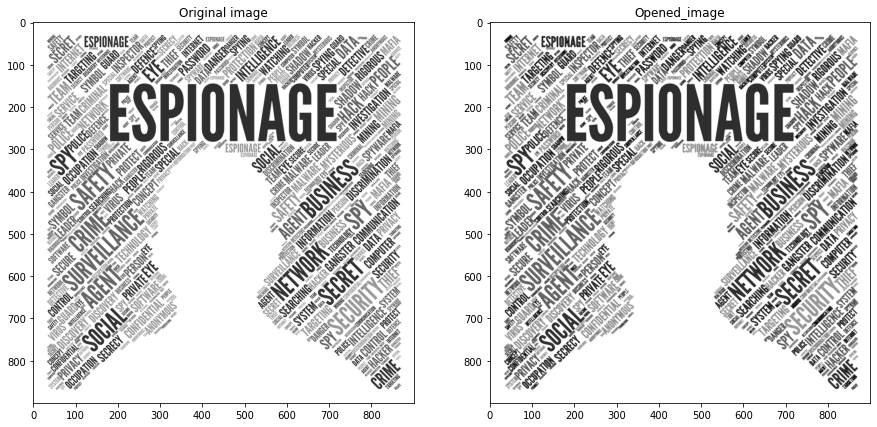

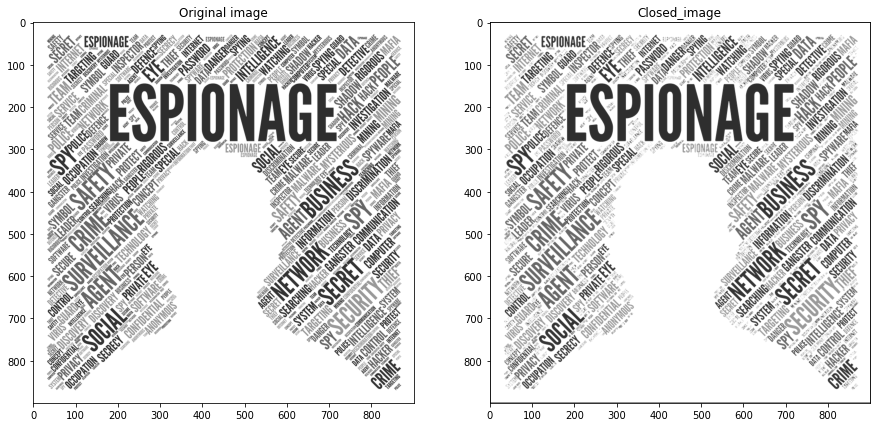

In [ ]:
# 팽창(dilation) 결과 출력
dilated_img = dilation_3x3(img)
images = [img, dilated_img]
titles = ['Original image', 'Dilated_image']
plot_img(images, titles)


# 침식(dilation) 결과 출력
eroded_img = erosion_3x3(img)
images = [img, eroded_img]
titles = ['Original image', 'Eroded_image']
plot_img(images, titles)


# 열기(open) 결과 출력
opened_img = open_3x3(img)
images = [img, opened_img]
titles = ['Original image', 'Opened_image']
plot_img(images, titles)


# 닫기(close) 결과 출력
closed_img = close_3x3(img)
images = [img, closed_img]
titles = ['Original image', 'Closed_image']
plot_img(images, titles)

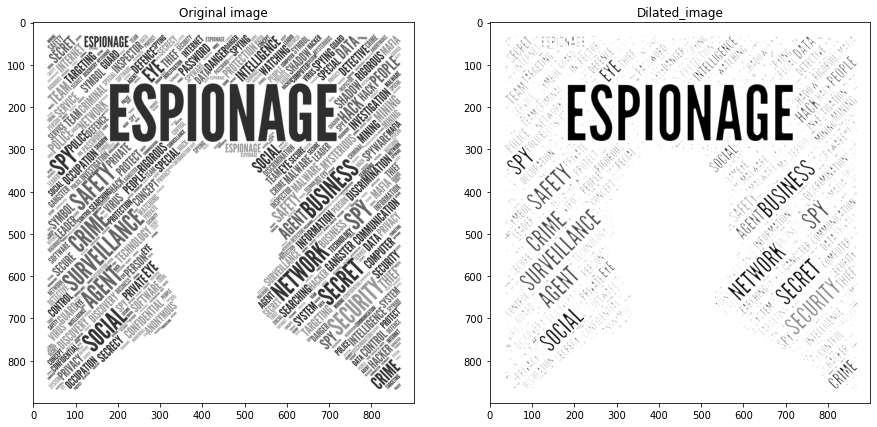

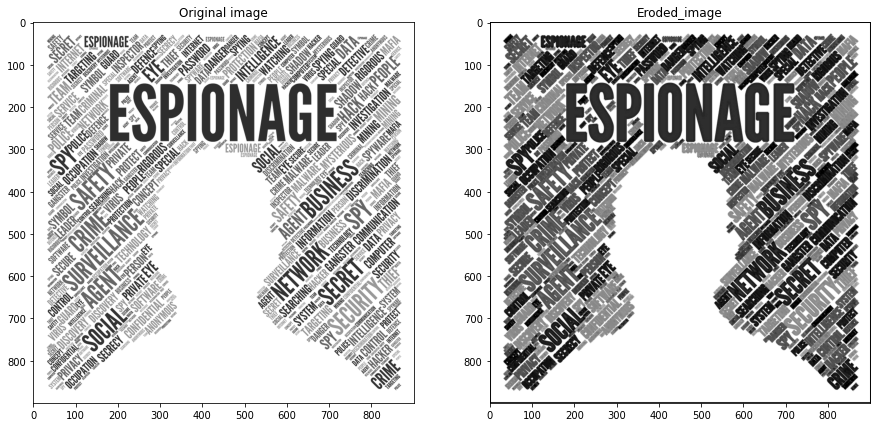

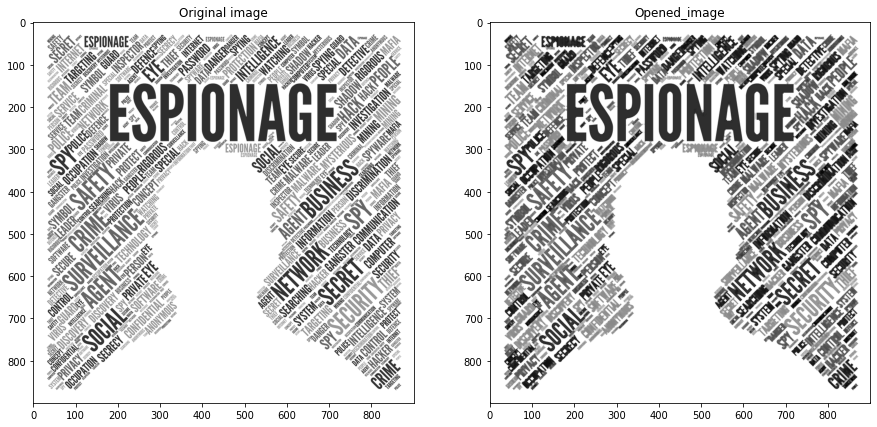

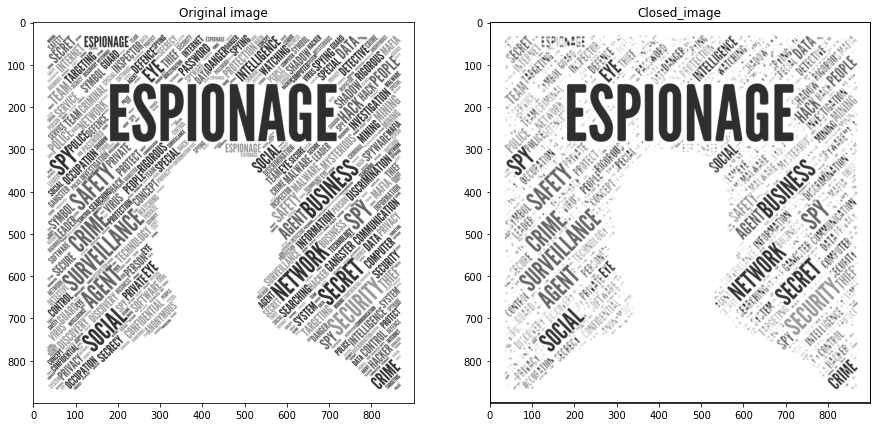

In [ ]:
# 팽창(dilation) 결과 출력
dilated_img = dilation_5x5(img)
images = [img, dilated_img]
titles = ['Original image', 'Dilated_image']
plot_img(images, titles)

# 침식(dilation) 결과 출력
eroded_img = erosion_5x5(img)
images = [img, eroded_img]
titles = ['Original image', 'Eroded_image']
plot_img(images, titles)

# 열기(open) 결과 출력
opened_img = open_5x5(img)
images = [img, opened_img]
titles = ['Original image', 'Opened_image']
plot_img(images, titles)

# 닫기(close) 결과 출력
closed_img = close_5x5(img)
images = [img, closed_img]
titles = ['Original image', 'Closed_image']
plot_img(images, titles)

----------------
# 2) openCV 이용

In [ ]:
#3x3 팽창(dilatioin) 함수 작성
def dilation_3x3(img):
    # 함수 작성
    kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], np.uint8)
    output_img = cv2.dilate(img, kernel)
    return output_img

#3x3 침식(erosion) 함수 작성
def erosion_3x3(img):
    # 함수 작성
    kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], np.uint8)
    output_img = cv2.erode(img, kernel)
    return output_img

#3x3 열기(open) 함수 작성
def open_3x3(img):
    # 함수 작성
    kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], np.uint8)
    output_img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    return output_img

#3x3 닫기(close) 함수 작성
def close_3x3(img):
    # 함수 작성
    kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], np.uint8)
    output_img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    return output_img

In [ ]:
#5x5 팽창(dilatioin) 함수 작성
def dilation_5x5(img):
    # 함수 작성
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    output_img = cv2.dilate(img, kernel)
    return output_img

#5x5 침식(erosion) 함수 작성
def erosion_5x5(img):
    # 함수 작성
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    output_img = cv2.erode(img, kernel)
    return output_img

#5x5 열기(open) 함수 작성
def open_5x5(img):
    # 함수 작성
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    output_img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    return output_img

#5x5 닫기(close) 함수 작성
def close_5x5(img):
    # 함수 작성
    kernel = np.array([[0, 0, 1, 0, 0], [0, 0, 1, 0, 0], [1, 1, 1, 1, 1], [0, 0, 1, 0, 0], [0, 0, 1, 0, 0]], np.uint8)
    output_img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    return output_img

함수를 이용하여 가시화

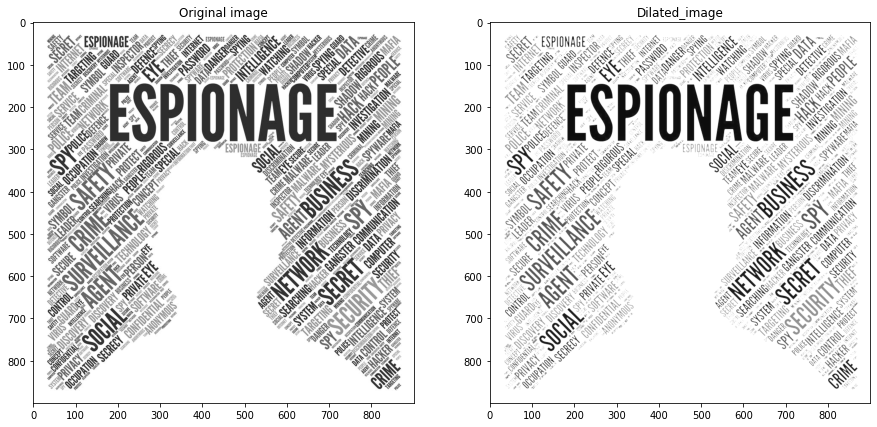

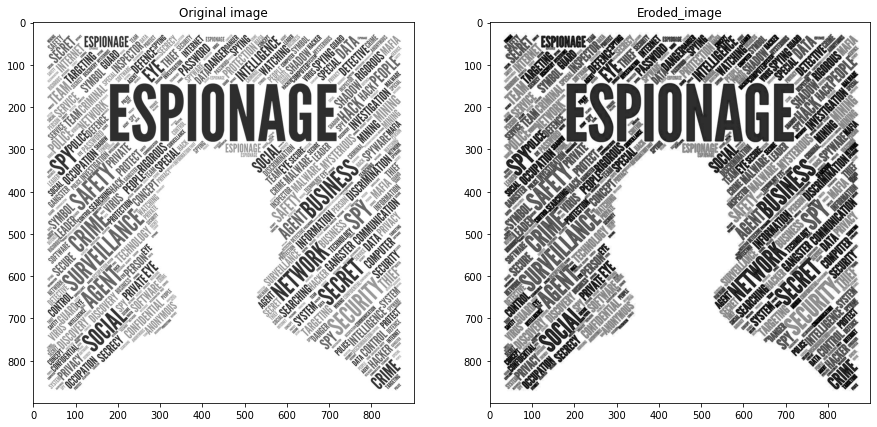

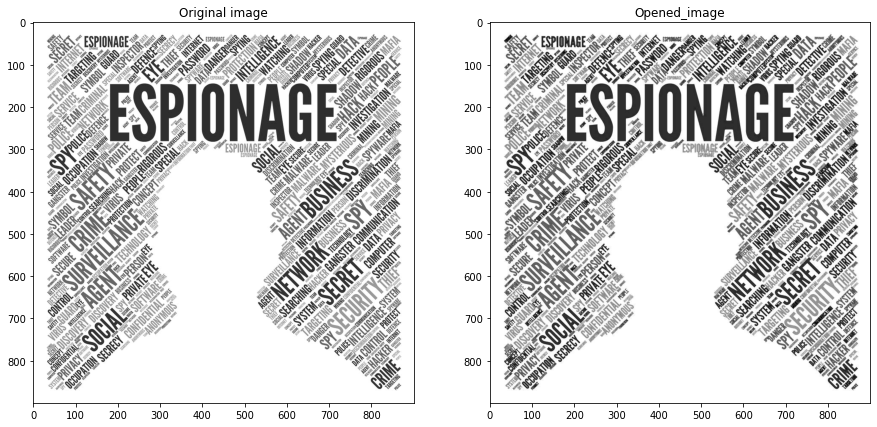

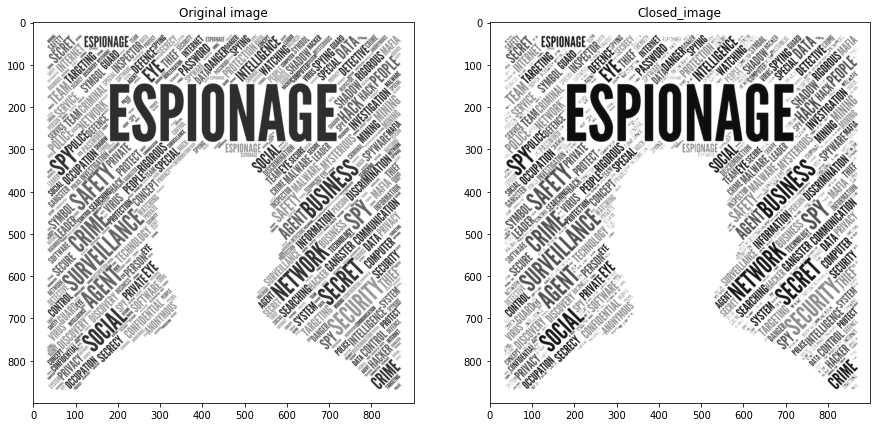

In [ ]:
# 팽창(dilation) 결과 출력
dilated_img = dilation_3x3(img)
images = [img, dilated_img]
titles = ['Original image', 'Dilated_image']
plot_img(images, titles)

# 침식(dilation) 결과 출력
eroded_img = erosion_3x3(img)
images = [img, eroded_img]
titles = ['Original image', 'Eroded_image']
plot_img(images, titles)

# 열기(open) 결과 출력
opened_img = open_3x3(img)
images = [img, opened_img]
titles = ['Original image', 'Opened_image']
plot_img(images, titles)

# 닫기(close) 결과 출력
closed_img = close_3x3(img)
images = [img, closed_img]
titles = ['Original image', 'Closed_image']
plot_img(images, titles)

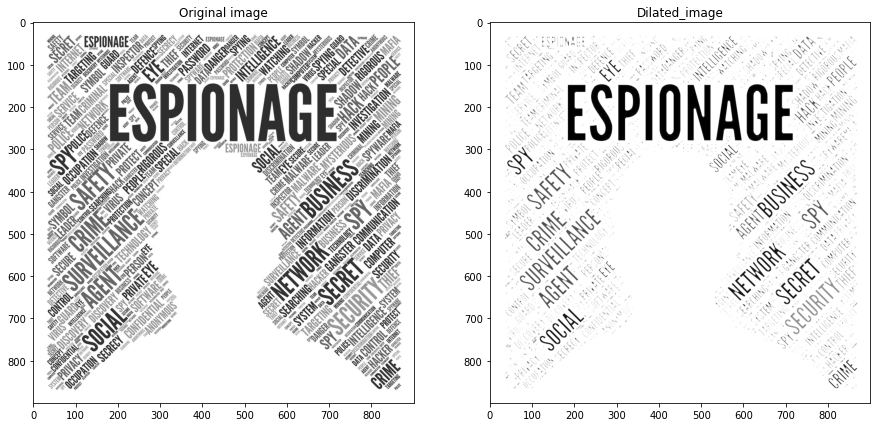

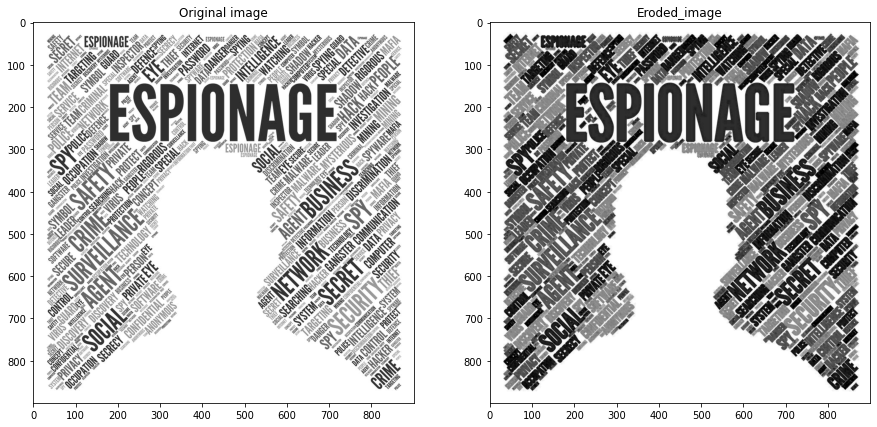

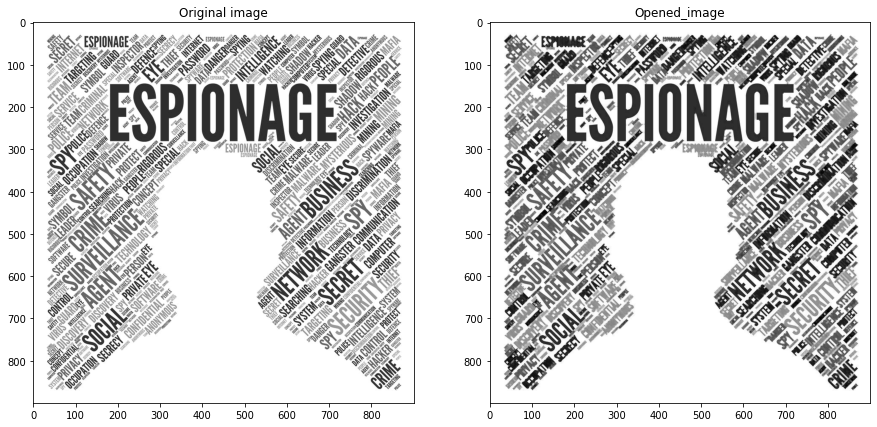

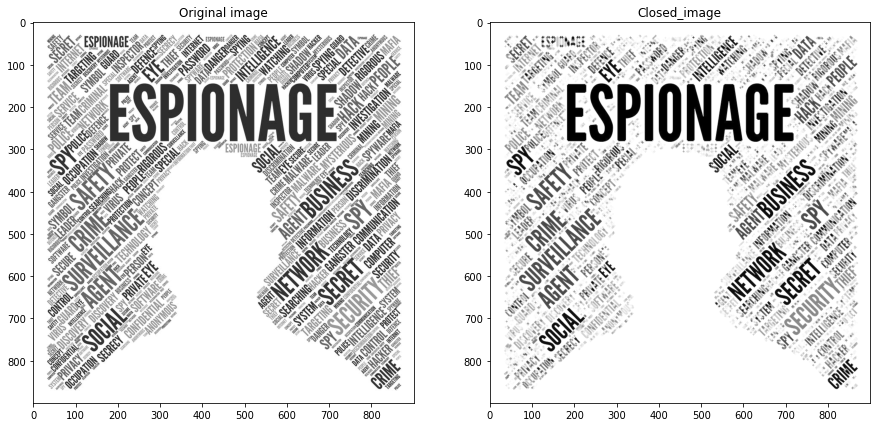

In [ ]:
# 팽창(dilation) 결과 출력
dilated_img = dilation_5x5(img)
images = [img, dilated_img]
titles = ['Original image', 'Dilated_image']
plot_img(images, titles)

# 침식(dilation) 결과 출력
eroded_img = erosion_5x5(img)
images = [img, eroded_img]
titles = ['Original image', 'Eroded_image']
plot_img(images, titles)

# 열기(open) 결과 출력
opened_img = open_5x5(img)
images = [img, opened_img]
titles = ['Original image', 'Opened_image']
plot_img(images, titles)

# 닫기(close) 결과 출력
closed_img = close_5x5(img)
images = [img, closed_img]
titles = ['Original image', 'Closed_image']
plot_img(images, titles)